In [1]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 20.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 6.5 MB/s eta 0:00:00


In [2]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, LSTM, SimpleRNN
from keras.optimizers import Adagrad
from sklearn.preprocessing import MinMaxScaler
import optuna
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
def mse(observations, estimates):

    assert len(observations) == len(estimates), "Arrays must be of equal length"
    difference = observations - estimates
    mse = sum(difference ** 2)/len(observations)

    return mse

def create_sequences(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i+sequence_length])
        y.append(data[i+sequence_length])
    return np.array(X), np.array(y)

In [4]:
btc_df = pd.read_csv("./Bitcoin Price (2014-2023) export 2024-12-15 11-39-22.csv")
btc_df

,Date,Open,High,Low,Close,Adj Close,Volume
0,2014-09-17 00:00:00.000,465.864014,468.174011,452.421997,457.334015,457.334015,21056800
1,2014-09-18 00:00:00.000,456.859985,456.859985,413.104004,424.440002,424.440002,34483200
2,2014-09-19 00:00:00.000,424.102997,427.834991,384.532013,394.795990,394.795990,37919700
3,2014-09-20 00:00:00.000,394.673004,423.295990,389.882996,408.903992,408.903992,36863600
4,2014-09-21 00:00:00.000,408.084991,412.425995,393.181000,398.821014,398.821014,26580100
...,...,...,...,...,...,...,...
3223,2023-07-15 00:00:00.000,30331.783203,30407.781250,30263.462891,30295.806641,30295.806641,8011667756
3224,2023-07-16 00:00:00.000,30297.472656,30437.560547,30089.669922,30249.132813,30249.132813,8516564470
3225,2023-07-17 00:00:00.000,30249.626953,30336.400391,29685.783203,30145.888672,30145.888672,13240156074
3226,2023-07-18 00:00:00.000,30147.070313,30233.656250,29556.427734,29856.562500,29856.562500,13138897269


In [5]:
features_dl = btc_df.loc[:, ~btc_df.columns.isin(['Close', 'Date', 'Open', 'High', 'Low', 'Adj Close'])]

endog_var_dl = btc_df['Close']

amount_of_columns = features_dl.columns.size

## LSTM

In [6]:
values = np.concatenate((features_dl.values, endog_var_dl.values.reshape((-1, 1))), axis=1)
scaler = MinMaxScaler(feature_range=(0, 1))
values = scaler.fit_transform(endog_var_dl.values.reshape((-1, 1)))

sequence_length = 20

train = values[:-700, :]
val = values[-700:-400, :]
train_val=values[:-400, :]
test = values[-400:, :]

train_X, train_y = create_sequences(train, sequence_length)
val_X, val_y = create_sequences(val, sequence_length)
train_val_X, train_val_y = create_sequences(train_val, sequence_length)
test_X, test_y = create_sequences(test, sequence_length)

train_X = train_X.reshape((train_X.shape[0], train_X.shape[1], 1))
val_X = val_X.reshape((val_X.shape[0], val_X.shape[1], 1))
train_val_X = train_val_X.reshape((train_val_X.shape[0], train_val_X.shape[1], 1))
test_X = test_X.reshape((test_X.shape[0], test_X.shape[1], 1))


def create_model_LSTM(units, dropout_rate):
    model = keras.Sequential([
        layers.LSTM(units=units, input_shape=train_X.shape[1:]),
        layers.Dropout(dropout_rate),
        layers.Dense(1, activation='relu')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['mse'])
    return model

def objective(trial):
    global train_X, train_y

    units = trial.suggest_int('units', 16, 128)
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-6, 1e-4)
    batch_size = trial.suggest_int('batch_size', 16, 64)

    model = create_model_LSTM(units, dropout_rate)

    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mse', metrics=['mae'])

    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    model.fit(train_X, train_y, epochs=200, batch_size=batch_size, validation_data=(val_X, val_y), verbose=0, callbacks=[early_stopping])

    score = model.evaluate(val_X, val_y, verbose=0)

    return score[0]

In [ ]:
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=10)

print('Best trial:')
trial = study.best_trial

print('  Value: {}'.format(trial.value))
print('  Params: ')
for key, value in trial.params.items():
    print('    {}: {}'.format(key, value))

[I 2024-12-18 12:47:07,028] A new study created in memory with name: no-name-a08d4e80-7a75-420a-8bb9-920420312fe6
<ipython-input-32-027a51dcc915>:45: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-6, 1e-4)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
[I 2024-12-18 12:48:52,219] Trial 0 finished with value: 0.0010439229663461447 and parameters: {'units': 57, 'dropout_rate': 0.27997569291386437, 'learning_rate': 6.986085730122007e-05, 'batch_size': 34}. Best is trial 0 with value: 0.0010439229663461447.
[I 2024-12-18 12:49:04,520] Tri

Best trial:
  Value: 0.0010439229663461447
  Params: 
    units: 57
    dropout_rate: 0.27997569291386437
    learning_rate: 6.986085730122007e-05
    batch_size: 34


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/200
74/74 - 5s - 63ms/step - loss: 0.0375 - val_loss: 0.3120
Epoch 2/200
74/74 - 0s - 4ms/step - loss: 0.0280 - val_loss: 0.2388
Epoch 3/200
74/74 - 0s - 4ms/step - loss: 0.0210 - val_loss: 0.1811
Epoch 4/200
74/74 - 0s - 4ms/step - loss: 0.0164 - val_loss: 0.1352
Epoch 5/200
74/74 - 0s - 6ms/step - loss: 0.0121 - val_loss: 0.0988
Epoch 6/200
74/74 - 1s - 8ms/step - loss: 0.0095 - val_loss: 0.0709
Epoch 7/200
74/74 - 1s - 9ms/step - loss: 0.0071 - val_loss: 0.0499
Epoch 8/200
74/74 - 0s - 6ms/step - loss: 0.0058 - val_loss: 0.0345
Epoch 9/200
74/74 - 0s - 6ms/step - loss: 0.0047 - val_loss: 0.0233
Epoch 10/200
74/74 - 0s - 4ms/step - loss: 0.0039 - val_loss: 0.0156
Epoch 11/200
74/74 - 0s - 4ms/step - loss: 0.0034 - val_loss: 0.0108
Epoch 12/200
74/74 - 0s - 4ms/step - loss: 0.0032 - val_loss: 0.0075
Epoch 13/200
74/74 - 0s - 4ms/step - loss: 0.0026 - val_loss: 0.0055
Epoch 14/200
74/74 - 0s - 4ms/step - loss: 0.0023 - val_loss: 0.0045
Epoch 15/200
74/74 - 0s - 4ms/step - loss:

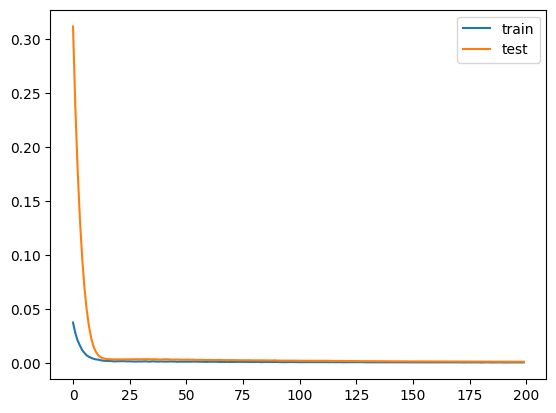

In [ ]:
trial = {
    "units": 57,
    "dropout_rate": 0.27997569291386437,
    "learning_rate": 6.986085730122007e-05,
    "batch_size": 34
}

train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
val_X = val_X.reshape((val_X.shape[0], 1, val_X.shape[1]))

model = Sequential()
model.add(LSTM(trial['units'], input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dropout(trial['dropout_rate']))
model.add(Dense(1, activation='relu'))
model.compile(loss='mean_squared_error', optimizer=Adam(learning_rate=trial['learning_rate']))

history = model.fit(train_X, train_y,
                    epochs=200, batch_size=trial['batch_size'],
                    validation_data=(val_X, val_y),
                    verbose=2, shuffle=False)

plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [ ]:
yhat = model.predict(test_X)
yhat[yhat<0] = 0
yhat_train = model.predict(train_X)
yhat_train[yhat_train<0] = 0
yhat_val = model.predict(val_X)
yhat_val[yhat_val<0] = 0

test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
train_X = train_X.reshape((train_X.shape[0], train_X.shape[2]))
val_X = val_X.reshape((val_X.shape[0], val_X.shape[2]))

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


Validation MSE: 5295516.577
Test MSE: 1052875.184


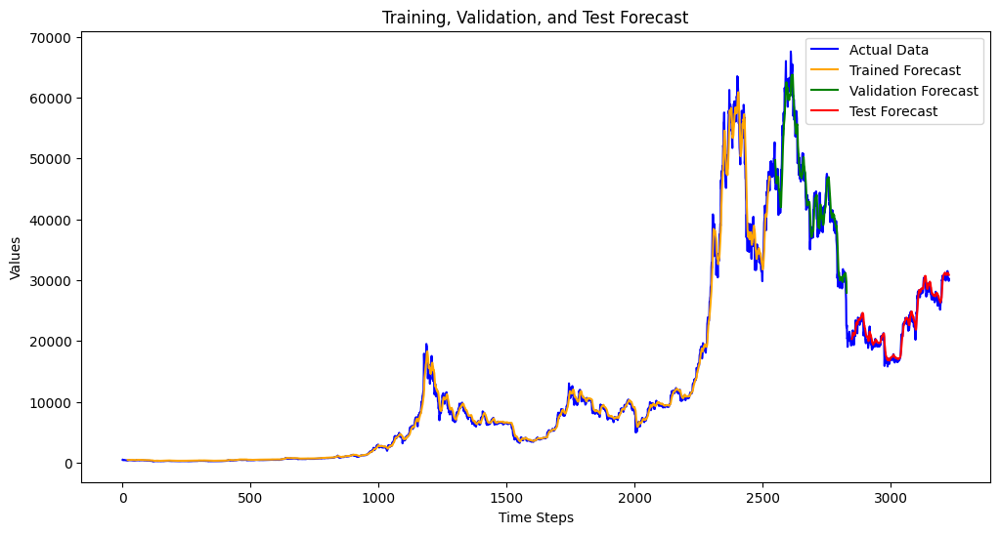

In [ ]:

inv_yhat_train = scaler.inverse_transform(yhat_train.reshape(-1, 1)).flatten()
inv_yhat_val = scaler.inverse_transform(yhat_val.reshape(-1, 1)).flatten()
inv_yhat_test = scaler.inverse_transform(yhat.reshape(-1, 1)).flatten()
inv_y_val = scaler.inverse_transform(val_y.reshape(-1, 1)).flatten()
inv_y_test = scaler.inverse_transform(test_y.reshape(-1, 1)).flatten()

rmse_val = np.sqrt(mse(inv_y_val, inv_yhat_val))
rmse_test = np.sqrt(mse(inv_y_test, inv_yhat_test))

print("Validation MSE: %.3f" % rmse_val**2)
print("Test MSE: %.3f" % rmse_test**2)

plt.figure(figsize=(12, 6))

plt.plot(range(len(values)), scaler.inverse_transform(values).flatten(),
         label="Actual Data", color='blue')

train_plot_index = range(sequence_length, sequence_length + len(inv_yhat_train))
plt.plot(train_plot_index, inv_yhat_train, label="Trained Forecast", color='orange')

val_plot_index = range(len(train_plot_index) + sequence_length + 20,
                       len(train_plot_index) + sequence_length + len(inv_yhat_val) + 20)
plt.plot(val_plot_index, inv_yhat_val, label="Validation Forecast", color='green')

test_plot_index = range(val_plot_index[-1] + sequence_length,
                        val_plot_index[-1] + sequence_length + len(inv_yhat_test))
plt.plot(test_plot_index, inv_yhat_test, label="Test Forecast", color='red')

plt.legend()
plt.xlabel("Time Steps")
plt.ylabel("Values")
plt.title("Training, Validation, and Test Forecast")
plt.show()


## CNN

In [7]:
def create_model_CNN(filters, kernel_size, dropout_rate, input_shape):
    model = keras.Sequential([
        layers.Conv1D(filters=filters, kernel_size=kernel_size, activation='relu', input_shape=input_shape),
        layers.MaxPooling1D(pool_size=2),
        layers.Dropout(dropout_rate),
        layers.Flatten(),
        layers.Dense(1, activation='relu')
    ])
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

def objective_CNN(trial):
    global train_X, train_y, val_X, val_y

    filters = trial.suggest_int('filters', 16, 128)
    kernel_size = trial.suggest_int('kernel_size', 2, 5)
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-6, 1e-4)
    batch_size = trial.suggest_int('batch_size', 16, 64)

    model = create_model_CNN(filters, kernel_size, dropout_rate, input_shape=(train_X.shape[1], train_X.shape[2]))

    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])

    early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    model.fit(train_X, train_y,
              epochs=100,
              batch_size=batch_size,
              validation_data=(val_X, val_y),
              verbose=0,
              callbacks=[early_stopping])

    score = model.evaluate(val_X, val_y, verbose=0)
    return score[0]

In [8]:
train_X, train_y = create_sequences(train, sequence_length)
val_X, val_y = create_sequences(val, sequence_length)
train_val_X, train_val_y = create_sequences(train_val, sequence_length)
test_X, test_y = create_sequences(test, sequence_length)

train_X = train_X.reshape((train_X.shape[0], train_X.shape[1], 1))
val_X = val_X.reshape((val_X.shape[0], val_X.shape[1], 1))
train_val_X = train_val_X.reshape((train_val_X.shape[0], train_val_X.shape[1], 1))
test_X = test_X.reshape((test_X.shape[0], test_X.shape[1], 1))

study = optuna.create_study(direction='minimize')
study.optimize(objective_CNN, n_trials=10)

print('Best trial:')
trial_CNN = study.best_trial

print('  Value: {}'.format(trial_CNN.value))
print('  Params: ')
for key, value in trial_CNN.params.items():
    print('    {}: {}'.format(key, value))

[I 2024-12-19 07:02:25,877] A new study created in memory with name: no-name-3e7b31da-9688-47df-9ba9-825465d347f0
<ipython-input-7-85427f1627c8>:18: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-6, 1e-4)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
[I 2024-12-19 07:03:06,550] Trial 0 finished with value: 0.0017443285323679447 and parameters: {'filters': 50, 'kernel_size': 5, 'dropout_rate': 0.21300310318968535, 'learning_rate': 4.507005064008913e-05, 'batch_size': 17}. Best

Best trial:
  Value: 0.0017443285323679447
  Params: 
    filters: 50
    kernel_size: 5
    dropout_rate: 0.21300310318968535
    learning_rate: 4.507005064008913e-05
    batch_size: 17


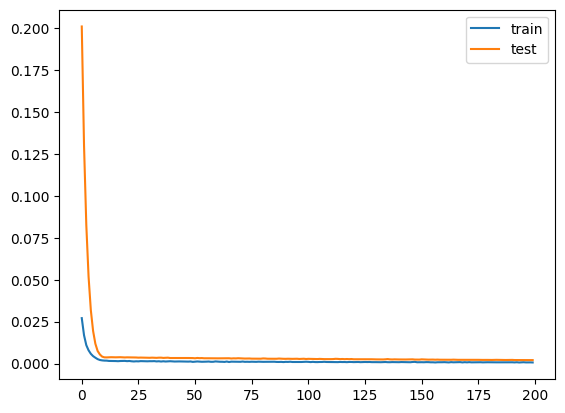

In [9]:
trial_CNN = {
    "filters": 50,
    "kernel_size": 5,
    "dropout_rate": 0.21300310318968535,
    "learning_rate": 4.507005064008913e-05,
    "batch_size": 17
}

model_CNN = keras.Sequential([
    layers.Conv1D(filters=trial_CNN['filters'],
                  kernel_size=trial_CNN['kernel_size'],
                  activation='relu',
                  input_shape=(train_X.shape[1], train_X.shape[2])),
    layers.MaxPooling1D(pool_size=2),
    layers.Dropout(trial_CNN['dropout_rate']),
    layers.Flatten(),
    layers.Dense(1, activation='relu')
])
model_CNN.compile(loss='mean_squared_error', optimizer=Adam(learning_rate=trial_CNN['learning_rate']))

history = model_CNN.fit(train_X, train_y,
                    epochs=200,
                    batch_size=trial_CNN['batch_size'],
                    validation_data=(val_X, val_y),
                    verbose=0, shuffle=False)

plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [11]:
yhat = model_CNN.predict(test_X)
yhat_train = model_CNN.predict(train_X)
yhat_val = model_CNN.predict(val_X)

test_X = test_X.reshape((test_X.shape[0], test_X.shape[1]))
train_X = train_X.reshape((train_X.shape[0], train_X.shape[1]))
val_X = val_X.reshape((val_X.shape[0], val_X.shape[1]))

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


Validation MSE: 9425563.899
Test MSE: 1863906.599


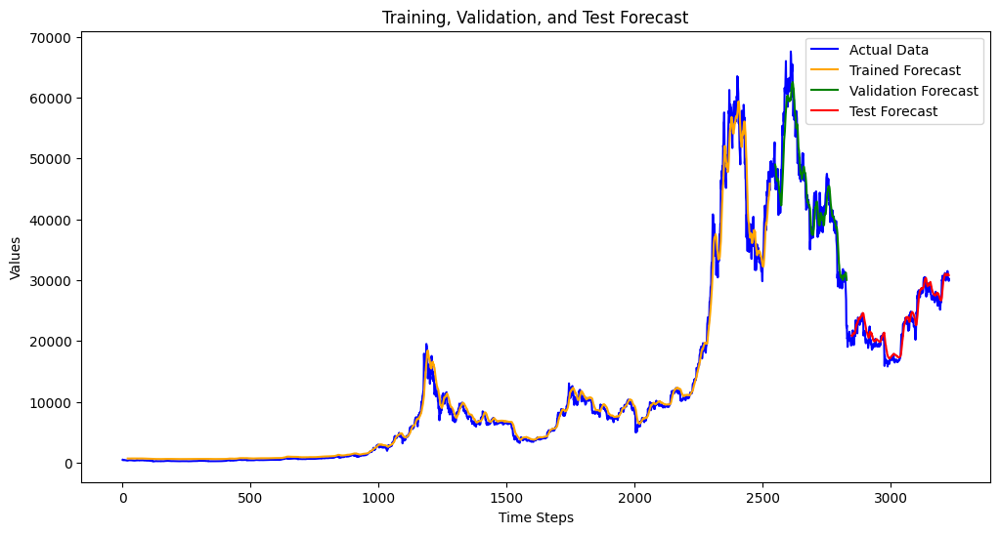

In [12]:
inv_yhat_train = scaler.inverse_transform(yhat_train.reshape(-1, 1)).flatten()
inv_yhat_val = scaler.inverse_transform(yhat_val.reshape(-1, 1)).flatten()
inv_yhat_test = scaler.inverse_transform(yhat.reshape(-1, 1)).flatten()
inv_y_val = scaler.inverse_transform(val_y.reshape(-1, 1)).flatten()
inv_y_test = scaler.inverse_transform(test_y.reshape(-1, 1)).flatten()

rmse_val = np.sqrt(mse(inv_y_val, inv_yhat_val))
rmse_test = np.sqrt(mse(inv_y_test, inv_yhat_test))

print("Validation MSE: %.3f" % rmse_val**2)
print("Test MSE: %.3f" % rmse_test**2)

plt.figure(figsize=(12, 6))

plt.plot(range(len(values)), scaler.inverse_transform(values).flatten(),
         label="Actual Data", color='blue')

train_plot_index = range(sequence_length, sequence_length + len(inv_yhat_train))
plt.plot(train_plot_index, inv_yhat_train, label="Trained Forecast", color='orange')

val_plot_index = range(len(train_plot_index) + sequence_length + 20,
                       len(train_plot_index) + sequence_length + len(inv_yhat_val) + 20)
plt.plot(val_plot_index, inv_yhat_val, label="Validation Forecast", color='green')

test_plot_index = range(val_plot_index[-1] + sequence_length,
                        val_plot_index[-1] + sequence_length + len(inv_yhat_test))
plt.plot(test_plot_index, inv_yhat_test, label="Test Forecast", color='red')

plt.legend()
plt.xlabel("Time Steps")
plt.ylabel("Values")
plt.title("Training, Validation, and Test Forecast")
plt.show()

## RNN

In [ ]:
def create_model_RNN(units, dropout_rate, input_shape):
    model = keras.Sequential([
        layers.SimpleRNN(units=units, activation='relu', input_shape=input_shape, return_sequences=False),
        layers.Dropout(dropout_rate),
        layers.Dense(1, activation='relu')
    ])
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

def objective_RNN(trial):
    global train_X, train_y, val_X, val_y

    units = trial.suggest_int('units', 32, 128)
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-6, 1e-4)
    batch_size = trial.suggest_int('batch_size', 16, 64)

    model = create_model_RNN(units, dropout_rate, input_shape=(train_X.shape[1], train_X.shape[2]))

    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])

    early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    model.fit(train_X, train_y,
              epochs=100,
              batch_size=batch_size,
              validation_data=(val_X, val_y),
              verbose=0,
              callbacks=[early_stopping])

    score = model.evaluate(val_X, val_y, verbose=0)
    return score[0]


In [ ]:
train_X, train_y = create_sequences(train, sequence_length)
val_X, val_y = create_sequences(val, sequence_length)
train_val_X, train_val_y = create_sequences(train_val, sequence_length)
test_X, test_y = create_sequences(test, sequence_length)

train_X = train_X.reshape((train_X.shape[0], train_X.shape[1], 1))
val_X = val_X.reshape((val_X.shape[0], val_X.shape[1], 1))
train_val_X = train_val_X.reshape((train_val_X.shape[0], train_val_X.shape[1], 1))
test_X = test_X.reshape((test_X.shape[0], test_X.shape[1], 1))

study = optuna.create_study(direction='minimize')
study.optimize(objective_RNN, n_trials=10)

print('Best trial:')
trial_RNN = study.best_trial

print('  Value: {}'.format(trial_RNN.value))
print('  Params: ')
for key, value in trial_RNN.params.items():
    print('    {}: {}'.format(key, value))

[I 2024-12-18 14:50:07,365] A new study created in memory with name: no-name-e9974f90-21cb-46e7-9a53-71f99a519b5d
<ipython-input-18-73d4e4f9a56f>:15: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-6, 1e-4)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
[I 2024-12-18 14:50:54,744] Trial 0 finished with value: 0.0015887640183791518 and parameters: {'units': 88, 'dropout_rate': 0.3000756851624533, 'learning_rate': 6.786977375589881e-06, 'batch_size': 25}. Best is trial 0 with value: 0.0015887640183791518.
[I 2024-12-18 14:51:46,914] Tria

Best trial:
  Value: 0.0007455854793079197
  Params: 
    units: 53
    dropout_rate: 0.14522788553006635
    learning_rate: 5.928266909137043e-05
    batch_size: 36


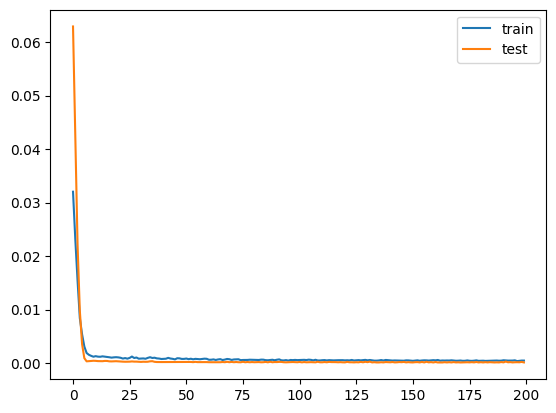

In [ ]:
model = keras.Sequential([
        layers.SimpleRNN(units=trial_RNN.params['units'], activation='relu', input_shape=(train_X.shape[1], train_X.shape[2]), return_sequences=False),
        layers.Dropout(trial_RNN.params['dropout_rate']),
        layers.Dense(1, activation='relu')
    ])
model.compile(loss='mean_squared_error', optimizer=Adam(learning_rate=trial_RNN.params['learning_rate']))

history = model.fit(train_X, train_y,
                    epochs=200, batch_size=trial_RNN.params['batch_size'],
                    validation_data=(test_X, test_y),
                    verbose=0, shuffle=False)

plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [ ]:
yhat = model.predict(test_X)
yhat_train = model.predict(train_X)
yhat_val = model.predict(val_X)

test_X = test_X.reshape((test_X.shape[0], test_X.shape[1]))
train_X = train_X.reshape((train_X.shape[0], train_X.shape[1]))
val_X = val_X.reshape((val_X.shape[0], val_X.shape[1]))

12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


Validation MSE: 3072279.116
Test MSE: 499894.320


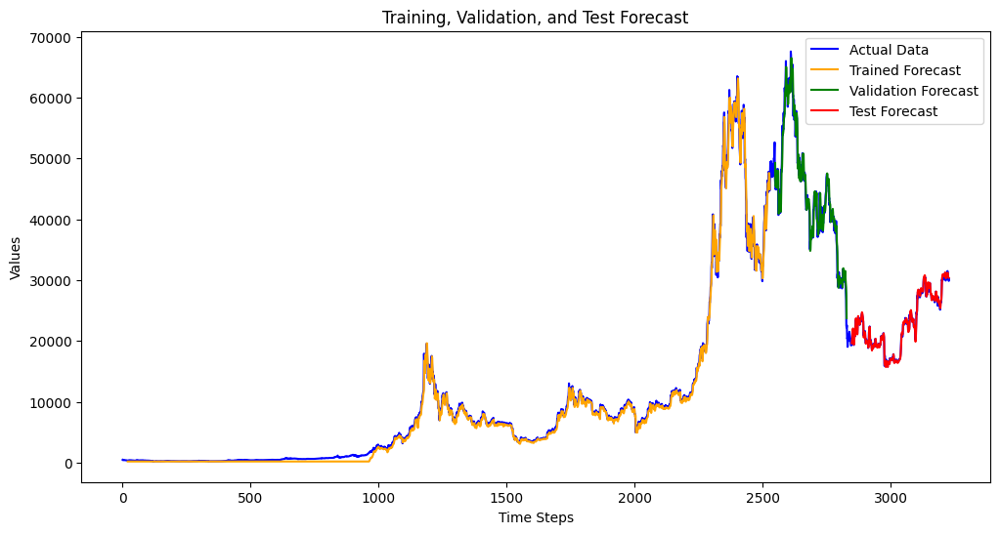

In [ ]:
inv_yhat_train = scaler.inverse_transform(yhat_train.reshape(-1, 1)).flatten()
inv_yhat_val = scaler.inverse_transform(yhat_val.reshape(-1, 1)).flatten()
inv_yhat_test = scaler.inverse_transform(yhat.reshape(-1, 1)).flatten()
inv_y_val = scaler.inverse_transform(val_y.reshape(-1, 1)).flatten()
inv_y_test = scaler.inverse_transform(test_y.reshape(-1, 1)).flatten()

rmse_val = np.sqrt(mse(inv_y_val, inv_yhat_val))
rmse_test = np.sqrt(mse(inv_y_test, inv_yhat_test))

print("Validation MSE: %.3f" % rmse_val**2)
print("Test MSE: %.3f" % rmse_test**2)

plt.figure(figsize=(12, 6))

plt.plot(range(len(values)), scaler.inverse_transform(values).flatten(),
         label="Actual Data", color='blue')

train_plot_index = range(sequence_length, sequence_length + len(inv_yhat_train))
plt.plot(train_plot_index, inv_yhat_train, label="Trained Forecast", color='orange')

val_plot_index = range(len(train_plot_index) + sequence_length + 20,
                       len(train_plot_index) + sequence_length + len(inv_yhat_val) + 20)
plt.plot(val_plot_index, inv_yhat_val, label="Validation Forecast", color='green')

test_plot_index = range(val_plot_index[-1] + sequence_length,
                        val_plot_index[-1] + sequence_length + len(inv_yhat_test))
plt.plot(test_plot_index, inv_yhat_test, label="Test Forecast", color='red')

plt.legend()
plt.xlabel("Time Steps")
plt.ylabel("Values")
plt.title("Training, Validation, and Test Forecast")
plt.show()

### Future prediction

In [13]:
test_future_X = test_X.reshape((test_X.shape[0], test_X.shape[1], -1))

In [14]:
next_days = 365
partial_data = test_future_X[-1:]
final_predictions = np.array([[]])

for ele in range(next_days):
  temp_prediction = model_CNN.predict(partial_data)
  final_predictions = np.concatenate([final_predictions, temp_prediction], axis=1)
  partial_data = partial_data[:, 1:]
  flattened_data = partial_data.reshape(-1, 1)
  flattened_data = np.concatenate([flattened_data, temp_prediction], axis=0)
  partial_data = flattened_data.reshape(1, -1, 1)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━

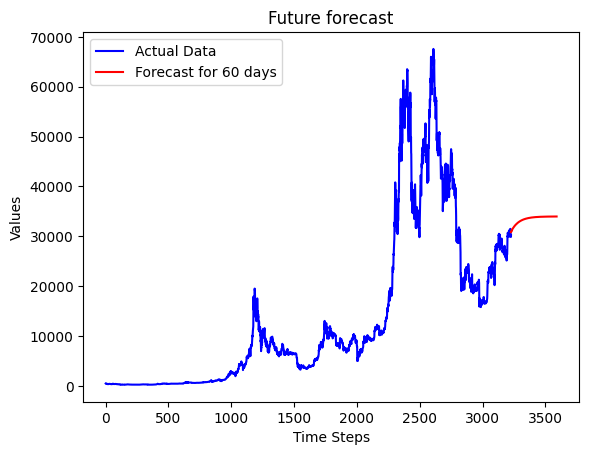

In [15]:
final_pred_scaled = scaler.inverse_transform(final_predictions.reshape(-1, 1)).flatten()
future_plot_index = range(test_plot_index[-1],
                        test_plot_index[-1] + next_days)

plt.plot(range(len(values)), scaler.inverse_transform(values).flatten(),
         label="Actual Data", color='blue')
plt.plot(future_plot_index, final_pred_scaled, label="Forecast for 60 days", color='red')

plt.legend()
plt.xlabel("Time Steps")
plt.ylabel("Values")
plt.title("Future forecast")
plt.show()

# Neuralforecast

In [16]:
!pip install neuralforecast


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.2/259.2 kB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.6/275.6 kB 21.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 53.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 MB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 57.8 MB/s eta 0:00:00


In [17]:
adv_btc_df = pd.DataFrame()

adv_btc_df['ds'] = pd.to_datetime(btc_df['Date'])
adv_btc_df['y'] = btc_df['Close']
adv_btc_df['unique_id'] = 1

adv_btc_df

,ds,y,unique_id
0,2014-09-17,457.334015,1
1,2014-09-18,424.440002,1
2,2014-09-19,394.795990,1
3,2014-09-20,408.903992,1
4,2014-09-21,398.821014,1
...,...,...,...
3223,2023-07-15,30295.806641,1
3224,2023-07-16,30249.132813,1
3225,2023-07-17,30145.888672,1
3226,2023-07-18,29856.562500,1


In [45]:
from neuralforecast import NeuralForecast
from neuralforecast.models import NBEATS, NHITS, LSTM, NBEATSx, GRU
from neuralforecast.auto import  AutoNBEATSx, AutoNBEATS, AutoLSTM, AutoGRU, AutoBiTCN

In [19]:
btc_train_df = adv_btc_df[adv_btc_df.ds <= '2023-01-12']
btc_test_df = adv_btc_df[adv_btc_df.ds > '2023-01-12']

INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 3.8 M  | train
-------------------------------------------------------
3.6 M     Trainable params
212 K     Non-trainable params
3.8 M     Total params
15.327    Total estimated model params size (MB)
31        Modules in train mod

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 3.5 M  | train
-------------------------------------------------------
3.5 M     Trainable params
0         Non-trainable params
3.5 M     Total params
13.992    Total estimated model params size (MB)
34        Modules in train mode
0        

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/neuralforecast/core.py:214: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


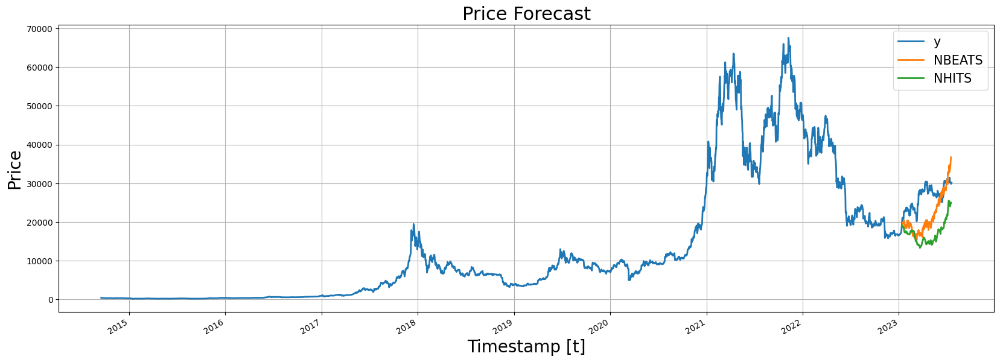

In [20]:
horizon = len(btc_test_df)
models = [
          NBEATS(
              input_size=2 * horizon,
              h=horizon,
              max_steps=500),
          NHITS(
              input_size=2 * horizon,
              h=horizon,
              max_steps=500)
          ]
nf = NeuralForecast(models=models, freq='D')
nf.fit(df=btc_train_df)
Y_hat_df = nf.predict().reset_index()

fig, ax = plt.subplots(1, 1, figsize = (20, 7))
Y_hat_df = btc_test_df.merge(Y_hat_df, how='left', on=['unique_id', 'ds'])
plot_df = pd.concat([btc_train_df, Y_hat_df]).set_index('ds')

plot_df[['y', 'NBEATS', 'NHITS']].plot(ax=ax, linewidth=2)

ax.set_title('Price Forecast', fontsize=22)
ax.set_ylabel('Price', fontsize=20)
ax.set_xlabel('Timestamp [t]', fontsize=20)
ax.legend(prop={'size': 15})
ax.grid()

#### Add exogeneous variables

In [21]:
adv_btc_df['Volume'] = btc_df['Volume']

adv_btc_df['is_bearish'] = np.where(adv_btc_df['ds'].dt.year % 4 == 2, 1, 0)
adv_btc_df['is_super_bullish'] = np.where(adv_btc_df['ds'].dt.year % 4 == 3, 1, 0)
adv_btc_df['is_bullish'] = np.where((adv_btc_df['ds'].dt.year % 4 == 0) | (adv_btc_df['ds'].dt.year % 4 == 1), 1, 0)

btc_train_df = adv_btc_df[adv_btc_df.ds <= '2023-01-12']
btc_test_df = adv_btc_df[adv_btc_df.ds > '2023-01-12']

In [22]:
models = [
    NBEATSx(
        input_size = horizon * 2,
        h=horizon,
        hist_exog_list=['Volume'],
        futr_exog_list=['is_bearish', 'is_super_bullish', 'is_bullish'],
        scaler_type="standard"
    ),
    NHITS(
        input_size = horizon * 2,
        h=horizon,
        hist_exog_list=['Volume'],
        futr_exog_list=['is_bearish', 'is_super_bullish', 'is_bullish'],
        scaler_type="standard"
    )
]

nf = NeuralForecast(models=models, freq='D')

futr_df = btc_test_df[['unique_id', 'ds', 'is_bearish', 'is_super_bullish', 'is_bullish']]

nf.fit(df=btc_train_df)


INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 7.0 M  | train
-------------------------------------------------------
6.8 M     Trainable params
212 K     Non-trainable params
7.0 M     Total params
28.033    Total estimated model params size (MB)
31        Modules in train mod

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 5.6 M  | train
-------------------------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.462    Total estimated model params size (MB)
34        Modules in train mode
0       

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.


In [23]:
missing_combinations = nf.get_missing_future(futr_df)
futr_df = pd.concat([futr_df, missing_combinations], ignore_index=True)
futr_df.iloc[-1, futr_df.columns.get_loc('is_bearish')] = 0
futr_df.iloc[-1, futr_df.columns.get_loc('is_super_bullish')] = 1
futr_df.iloc[-1, futr_df.columns.get_loc('is_bullish')] = 0
futr_df

,unique_id,ds,is_bearish,is_super_bullish,is_bullish
0,1,2023-01-13,0.0,1.0,0.0
1,1,2023-01-14,0.0,1.0,0.0
2,1,2023-01-15,0.0,1.0,0.0
3,1,2023-01-16,0.0,1.0,0.0
4,1,2023-01-17,0.0,1.0,0.0
...,...,...,...,...,...
184,1,2023-07-16,0.0,1.0,0.0
185,1,2023-07-17,0.0,1.0,0.0
186,1,2023-07-18,0.0,1.0,0.0
187,1,2023-07-20,0.0,1.0,0.0


/usr/local/lib/python3.10/dist-packages/neuralforecast/core.py:940: UserWarning: Dropped 1 unused rows from `futr_df`.
  warnings.warn(f"Dropped {dropped_rows:,} unused rows from `futr_df`.")
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/neuralforecast/core.py:214: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


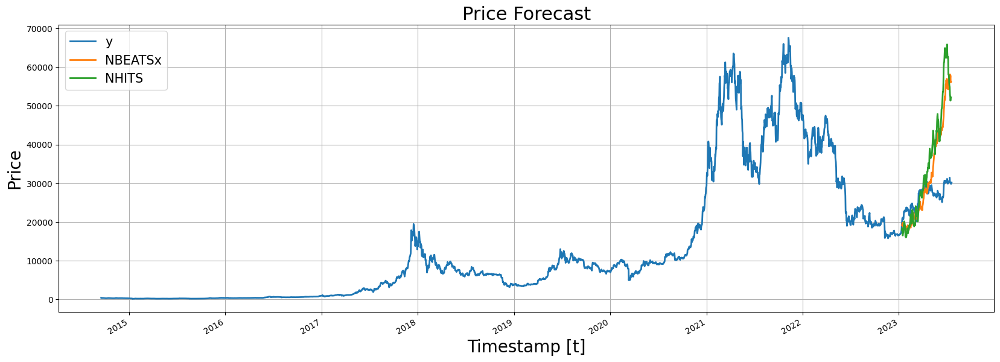

In [24]:
Y_hat_df = nf.predict(futr_df=futr_df)

fig, ax = plt.subplots(1, 1, figsize = (20, 7))
Y_hat_df = btc_test_df.merge(Y_hat_df, how='left', on=['unique_id', 'ds'])
plot_df = pd.concat([btc_train_df, Y_hat_df]).set_index('ds')

plot_df[['y', 'NBEATSx', 'NHITS']].plot(ax=ax, linewidth=2)

ax.set_title('Price Forecast', fontsize=22)
ax.set_ylabel('Price', fontsize=20)
ax.set_xlabel('Timestamp [t]', fontsize=20)
ax.legend(prop={'size': 15})
ax.grid()

#### Hyperparameters selection

[I 2024-12-19 07:14:33,828] A new study created in memory with name: no-name-7005e472-0f0d-4c82-9cdf-05b82fd82f97
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 15
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss      

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 07:14:49,421] Trial 0 finished with value: 7899832.0 and parameters: {'learning_rate': 0.03029050696589152, 'scaler_type': 'robust', 'max_steps': 500, 'batch_size': 64, 'windows_batch_size': 256, 'random_seed': 15, 'input_size': 752, 'step_size': 188}. Best is trial 0 with value: 7899832.0.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU a

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 07:15:06,509] Trial 1 finished with value: 63767.828125 and parameters: {'learning_rate': 0.001094007199981303, 'scaler_type': 'robust', 'max_steps': 500, 'batch_size': 32, 'windows_batch_size': 512, 'random_seed': 1, 'input_size': 940, 'step_size': 1}. Best is trial 1 with value: 63767.828125.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 11
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 07:15:38,598] Trial 2 finished with value: 21538189344768.0 and parameters: {'learning_rate': 0.040650107945370655, 'scaler_type': 'standard', 'max_steps': 1000, 'batch_size': 32, 'windows_batch_size': 512, 'random_seed': 11, 'input_size': 752, 'step_size': 1}. Best is trial 1 with value: 63767.828125.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 13
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.r

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 07:15:54,844] Trial 3 finished with value: 7948.1943359375 and parameters: {'learning_rate': 0.0002264358631294558, 'scaler_type': 'standard', 'max_steps': 500, 'batch_size': 32, 'windows_batch_size': 512, 'random_seed': 13, 'input_size': 376, 'step_size': 1}. Best is trial 3 with value: 7948.1943359375.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 5
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.r

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 07:16:28,107] Trial 4 finished with value: 30279.2890625 and parameters: {'learning_rate': 0.001092608170298149, 'scaler_type': None, 'max_steps': 1000, 'batch_size': 256, 'windows_batch_size': 256, 'random_seed': 5, 'input_size': 564, 'step_size': 1}. Best is trial 3 with value: 7948.1943359375.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zer

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 07:16:44,279] Trial 5 finished with value: 14579.3701171875 and parameters: {'learning_rate': 0.003750798596395505, 'scaler_type': None, 'max_steps': 500, 'batch_size': 256, 'windows_batch_size': 1024, 'random_seed': 1, 'input_size': 188, 'step_size': 188}. Best is trial 3 with value: 7948.1943359375.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 4
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 07:17:19,503] Trial 6 finished with value: 18895.7109375 and parameters: {'learning_rate': 0.004088085432024713, 'scaler_type': 'robust', 'max_steps': 1000, 'batch_size': 128, 'windows_batch_size': 512, 'random_seed': 4, 'input_size': 188, 'step_size': 1}. Best is trial 3 with value: 7948.1943359375.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 7
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 07:17:37,598] Trial 7 finished with value: 28324.751953125 and parameters: {'learning_rate': 0.009837544789668747, 'scaler_type': 'robust', 'max_steps': 500, 'batch_size': 128, 'windows_batch_size': 256, 'random_seed': 7, 'input_size': 376, 'step_size': 188}. Best is trial 3 with value: 7948.1943359375.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 3
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.ra

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 07:17:54,880] Trial 8 finished with value: 1761756.25 and parameters: {'learning_rate': 0.016685907454834618, 'scaler_type': 'standard', 'max_steps': 500, 'batch_size': 64, 'windows_batch_size': 1024, 'random_seed': 3, 'input_size': 940, 'step_size': 1}. Best is trial 3 with value: 7948.1943359375.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 6
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_ze

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 07:18:10,339] Trial 9 finished with value: 17217.056640625 and parameters: {'learning_rate': 0.0006162434963349843, 'scaler_type': 'standard', 'max_steps': 500, 'batch_size': 32, 'windows_batch_size': 256, 'random_seed': 6, 'input_size': 188, 'step_size': 1}. Best is trial 3 with value: 7948.1943359375.
INFO:lightning_fabric.utilities.seed:Seed set to 13
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | pa

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/neuralforecast/core.py:214: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


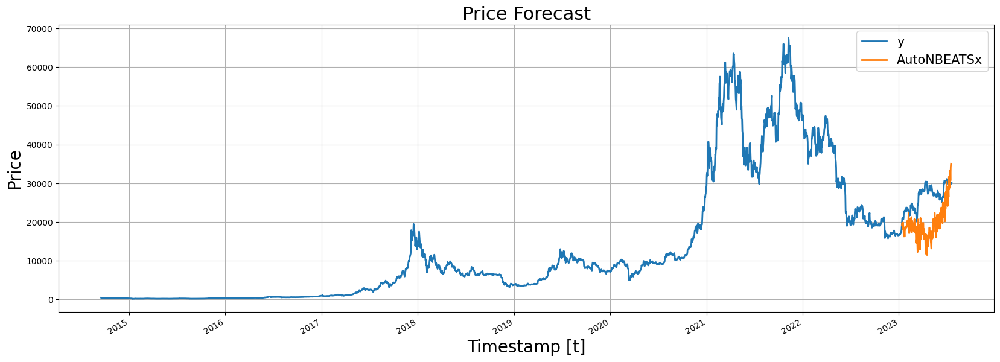

In [25]:
model = AutoNBEATSx(
      h=horizon,
      config=None,
      backend='optuna'
    )

nf = NeuralForecast(models=[model], freq='D')
nf.fit(df=btc_train_df)
Y_hat_df = nf.predict()

fig, ax = plt.subplots(1, 1, figsize = (20, 7))
Y_hat_df = btc_test_df.merge(Y_hat_df, how='left', on=['unique_id', 'ds'])
plot_df = pd.concat([btc_train_df, Y_hat_df]).set_index('ds')
plot_df[['y', 'AutoNBEATSx']].plot(ax=ax, linewidth=2)

ax.set_title('Price Forecast', fontsize=22)
ax.set_ylabel('Price', fontsize=20)
ax.set_xlabel('Timestamp [t]', fontsize=20)
ax.legend(prop={'size': 15})
ax.grid()

[I 2024-12-19 08:29:07,303] A new study created in memory with name: no-name-a8eaddcf-2898-42c3-b5ec-d896b2468c2c
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss       

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 08:29:37,255] Trial 0 finished with value: 3781704960.0 and parameters: {'learning_rate': 0.04208247636211, 'scaler_type': None, 'max_steps': 1000, 'batch_size': 256, 'windows_batch_size': 1024, 'random_seed': 1, 'input_size': 376, 'step_size': 1}. Best is trial 0 with value: 3781704960.0.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 9
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU a

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 08:29:53,408] Trial 1 finished with value: 40746.74609375 and parameters: {'learning_rate': 0.00018901625519836474, 'scaler_type': 'robust', 'max_steps': 500, 'batch_size': 256, 'windows_batch_size': 128, 'random_seed': 9, 'input_size': 940, 'step_size': 1}. Best is trial 1 with value: 40746.74609375.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 2
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 08:30:24,659] Trial 2 finished with value: 3059.478271484375 and parameters: {'learning_rate': 0.0003086130019429809, 'scaler_type': 'standard', 'max_steps': 1000, 'batch_size': 128, 'windows_batch_size': 512, 'random_seed': 2, 'input_size': 564, 'step_size': 188}. Best is trial 2 with value: 3059.478271484375.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 20
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.ut

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 08:31:08,850] Trial 3 finished with value: 2451798272.0 and parameters: {'learning_rate': 0.04690737470423918, 'scaler_type': 'standard', 'max_steps': 1000, 'batch_size': 256, 'windows_batch_size': 512, 'random_seed': 20, 'input_size': 752, 'step_size': 1}. Best is trial 2 with value: 3059.478271484375.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 4
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.r

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 08:31:27,106] Trial 4 finished with value: 18496.89453125 and parameters: {'learning_rate': 0.0023391406212553492, 'scaler_type': 'standard', 'max_steps': 500, 'batch_size': 32, 'windows_batch_size': 256, 'random_seed': 4, 'input_size': 188, 'step_size': 1}. Best is trial 2 with value: 3059.478271484375.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 5
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.r

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 08:32:06,531] Trial 5 finished with value: 8259.7021484375 and parameters: {'learning_rate': 0.001042090542103856, 'scaler_type': 'standard', 'max_steps': 1000, 'batch_size': 64, 'windows_batch_size': 1024, 'random_seed': 5, 'input_size': 376, 'step_size': 188}. Best is trial 2 with value: 3059.478271484375.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 13
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utili

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 08:32:39,046] Trial 6 finished with value: 6860.1044921875 and parameters: {'learning_rate': 0.0006282345508138551, 'scaler_type': 'robust', 'max_steps': 1000, 'batch_size': 256, 'windows_batch_size': 512, 'random_seed': 13, 'input_size': 752, 'step_size': 188}. Best is trial 2 with value: 3059.478271484375.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 20
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utili

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 08:33:16,131] Trial 7 finished with value: 3237931264.0 and parameters: {'learning_rate': 0.02312515188820577, 'scaler_type': 'robust', 'max_steps': 1000, 'batch_size': 32, 'windows_batch_size': 512, 'random_seed': 20, 'input_size': 564, 'step_size': 1}. Best is trial 2 with value: 3059.478271484375.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 3
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 08:33:34,124] Trial 8 finished with value: 3215.1533203125 and parameters: {'learning_rate': 0.00015807950461461357, 'scaler_type': 'standard', 'max_steps': 500, 'batch_size': 32, 'windows_batch_size': 128, 'random_seed': 3, 'input_size': 940, 'step_size': 188}. Best is trial 2 with value: 3059.478271484375.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 13
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilit

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 08:33:50,884] Trial 9 finished with value: 236164464.0 and parameters: {'learning_rate': 0.09779808335162471, 'scaler_type': 'standard', 'max_steps': 500, 'batch_size': 32, 'windows_batch_size': 512, 'random_seed': 13, 'input_size': 376, 'step_size': 188}. Best is trial 2 with value: 3059.478271484375.
INFO:lightning_fabric.utilities.seed:Seed set to 2
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padd

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/neuralforecast/core.py:214: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


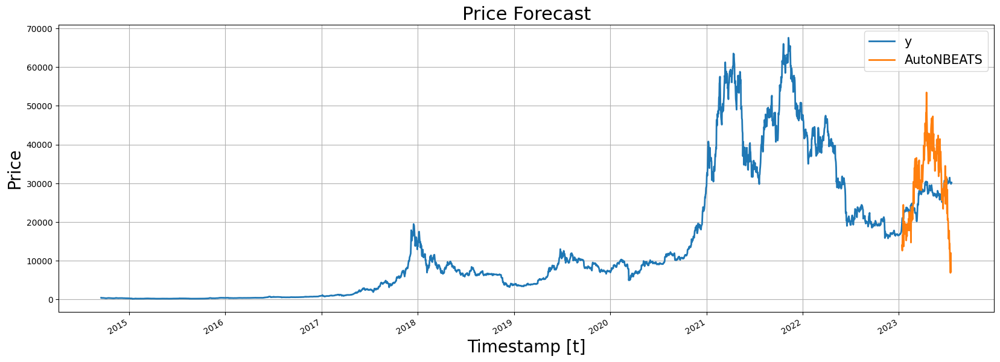

In [44]:
model = AutoNBEATS(
      h=horizon,
      config=None,
      backend='optuna'
    )

nf = NeuralForecast(models=[model], freq='D')
nf.fit(df=btc_train_df)
Y_hat_df = nf.predict()

fig, ax = plt.subplots(1, 1, figsize = (20, 7))
Y_hat_df = btc_test_df.merge(Y_hat_df, how='left', on=['unique_id', 'ds'])
plot_df = pd.concat([btc_train_df, Y_hat_df]).set_index('ds')

plot_df[['y', 'AutoNBEATS']].plot(ax=ax, linewidth=2)

ax.set_title('Price Forecast', fontsize=22)
ax.set_ylabel('Price', fontsize=20)
ax.set_xlabel('Timestamp [t]', fontsize=20)
ax.legend(prop={'size': 15})
ax.grid()

[I 2024-12-19 07:23:07,337] A new study created in memory with name: no-name-8f6a76ae-f331-4b89-9171-87d7ca0d448a
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 18
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 07:28:24,480] Trial 0 finished with value: 19727.501953125 and parameters: {'encoder_hidden_size': 300, 'encoder_n_layers': 3, 'context_size': 5, 'decoder_hidden_size': 512, 'learning_rate': 0.007502927734653028, 'max_steps': 1000, 'batch_size': 32, 'random_seed': 18, 'input_size': 3008, 'inference_input_size': -188}. Best is trial 0 with value: 19727.501953125.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 4
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 07:29:23,624] Trial 1 finished with value: 0.0 and parameters: {'encoder_hidden_size': 300, 'encoder_n_layers': 1, 'context_size': 50, 'decoder_hidden_size': 512, 'learning_rate': 0.03410891055337752, 'max_steps': 1000, 'batch_size': 32, 'random_seed': 4, 'input_size': 752, 'inference_input_size': -188}. Best is trial 1 with value: 0.0.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 2
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 07:32:28,283] Trial 2 finished with value: 25781.478515625 and parameters: {'encoder_hidden_size': 300, 'encoder_n_layers': 4, 'context_size': 10, 'decoder_hidden_size': 512, 'learning_rate': 0.0007056490583791317, 'max_steps': 500, 'batch_size': 32, 'random_seed': 2, 'input_size': 12032, 'inference_input_size': -188}. Best is trial 1 with value: 0.0.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 13
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, usin

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 07:35:19,135] Trial 3 finished with value: 16755.751953125 and parameters: {'encoder_hidden_size': 300, 'encoder_n_layers': 2, 'context_size': 10, 'decoder_hidden_size': 64, 'learning_rate': 0.010508531680546699, 'max_steps': 1000, 'batch_size': 32, 'random_seed': 13, 'input_size': 12032, 'inference_input_size': -188}. Best is trial 1 with value: 0.0.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 15
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, usi

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 07:36:05,595] Trial 4 finished with value: 18084.638671875 and parameters: {'encoder_hidden_size': 50, 'encoder_n_layers': 3, 'context_size': 5, 'decoder_hidden_size': 512, 'learning_rate': 0.03580393254587175, 'max_steps': 500, 'batch_size': 32, 'random_seed': 15, 'input_size': 3008, 'inference_input_size': -188}. Best is trial 1 with value: 0.0.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 15
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 07:36:53,039] Trial 5 finished with value: 27300.4609375 and parameters: {'encoder_hidden_size': 50, 'encoder_n_layers': 3, 'context_size': 5, 'decoder_hidden_size': 128, 'learning_rate': 0.0004767575588343841, 'max_steps': 1000, 'batch_size': 32, 'random_seed': 15, 'input_size': 12032, 'inference_input_size': -188}. Best is trial 1 with value: 0.0.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 2
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using:

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 07:37:33,804] Trial 6 finished with value: 15148.83203125 and parameters: {'encoder_hidden_size': 100, 'encoder_n_layers': 2, 'context_size': 10, 'decoder_hidden_size': 256, 'learning_rate': 0.039191873475557124, 'max_steps': 500, 'batch_size': 16, 'random_seed': 2, 'input_size': 3008, 'inference_input_size': -188}. Best is trial 1 with value: 0.0.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 3
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 07:37:50,976] Trial 7 finished with value: 24729.1328125 and parameters: {'encoder_hidden_size': 100, 'encoder_n_layers': 2, 'context_size': 5, 'decoder_hidden_size': 256, 'learning_rate': 0.0004813087907179324, 'max_steps': 500, 'batch_size': 32, 'random_seed': 3, 'input_size': 752, 'inference_input_size': -188}. Best is trial 1 with value: 0.0.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 13
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 07:38:38,866] Trial 8 finished with value: 22112.1484375 and parameters: {'encoder_hidden_size': 50, 'encoder_n_layers': 3, 'context_size': 10, 'decoder_hidden_size': 512, 'learning_rate': 0.02096911835330098, 'max_steps': 500, 'batch_size': 16, 'random_seed': 13, 'input_size': 3008, 'inference_input_size': -188}. Best is trial 1 with value: 0.0.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 19
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 07:39:19,793] Trial 9 finished with value: 23864.6796875 and parameters: {'encoder_hidden_size': 100, 'encoder_n_layers': 3, 'context_size': 10, 'decoder_hidden_size': 64, 'learning_rate': 0.0002397677139542305, 'max_steps': 500, 'batch_size': 32, 'random_seed': 19, 'input_size': -188, 'inference_input_size': -188}. Best is trial 1 with value: 0.0.
INFO:lightning_fabric.utilities.seed:Seed set to 4
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | l

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/neuralforecast/core.py:214: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


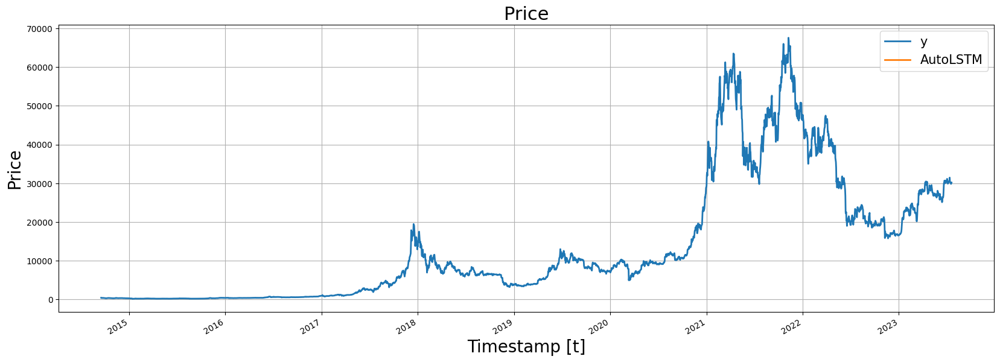

In [27]:
model = AutoLSTM(
      h=horizon,
      config=None,
      backend='optuna'
    )

nf = NeuralForecast(models=[model], freq='D')
nf.fit(df=btc_train_df)
Y_hat_df = nf.predict()

fig, ax = plt.subplots(1, 1, figsize = (20, 7))
Y_hat_df = btc_test_df.merge(Y_hat_df, how='left', on=['unique_id', 'ds'])
plot_df = pd.concat([btc_train_df, Y_hat_df]).set_index('ds')

plot_df[['y', 'AutoLSTM']].plot(ax=ax, linewidth=2)

ax.set_title('Price', fontsize=22)
ax.set_ylabel('Price', fontsize=20)
ax.set_xlabel('Timestamp [t]', fontsize=20)
ax.legend(prop={'size': 15})
ax.grid()

#### Best models

In [46]:
best_lstm = {'encoder_hidden_size': 100,
              'encoder_n_layers': 2,
              'context_size': 10,
              'decoder_hidden_size': 256,
              'learning_rate': 0.039191873475557124,
              'max_steps': 500,
              'batch_size': 16,
              'random_seed': 2,
              'input_size': 3008,
              'inference_input_size': -188}

best_nbeats = {'learning_rate': 0.0003086130019429809,
               'scaler_type': 'standard',
               'max_steps': 1000,
               'batch_size': 128,
               'windows_batch_size': 512,
               'random_seed': 2,
               'input_size': 564,
               'step_size': 188}

In [47]:
horizon = len(btc_test_df)
models = [
          NBEATS(
              input_size=best_nbeats['input_size'],
              step_size=best_nbeats['step_size'],
              h=horizon,
              max_steps=best_nbeats['max_steps'],
              learning_rate=best_nbeats['learning_rate'],
              scaler_type=best_nbeats['scaler_type'],
              batch_size=best_nbeats['batch_size'],
              windows_batch_size=best_nbeats['windows_batch_size']
              ),
          LSTM(
              h=horizon,
              encoder_hidden_size=best_lstm['encoder_hidden_size'],
              encoder_n_layers=best_lstm['encoder_n_layers'],
              context_size=best_lstm['context_size'],
              decoder_hidden_size=best_lstm['decoder_hidden_size'],
              learning_rate=best_lstm['learning_rate'],
              max_steps=best_lstm['max_steps'],
              batch_size=best_lstm['batch_size'],
              input_size=best_lstm['input_size'],
              inference_input_size=best_lstm['inference_input_size'],
          )
    ]

nf = NeuralForecast(models=models, freq='D')
nf.fit(df=btc_train_df)
Y_hat_df = nf.predict().reset_index()

INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type          | Params | Mode 
-------------------------------------------------------
0 | loss         | MAE           | 0      | train
1 | padder_train | ConstantPad1d | 0      | train
2 | scaler       | TemporalNorm  | 0      | train
3 | blocks       | ModuleList    | 4.3 M  | train
-------------------------------------------------------
4.0 M     Trainable params
283 K     Non-trainable params
4.3 M     Total params
17.151    Total estimated model params size (MB)
31        Modules in train mod

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss            | MAE           | 0      | train
1 | padder          | ConstantPad1d | 0      | train
2 | scaler          | TemporalNorm  | 0      | train
3 | hist_encoder    | LSTM          | 122 K  | train
4 | context_adapter | Linear        | 189 K  | train
5 | mlp_decoder     | MLP           | 3.1 K  | train
----------------------------------------------------------
314 K     Trainable params
0         Non-tr

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/neuralforecast/core.py:214: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


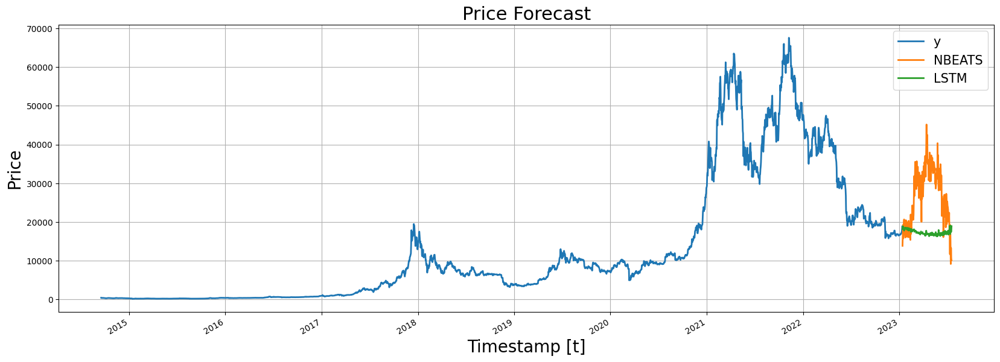

In [49]:
fig, ax = plt.subplots(1, 1, figsize = (20, 7))
Y_hat_df = btc_test_df.merge(Y_hat_df, how='left', on=['unique_id', 'ds'])
plot_df = pd.concat([btc_train_df, Y_hat_df]).set_index('ds')

plot_df[['y', 'NBEATS', 'LSTM']].plot(ax=ax, linewidth=2)

ax.set_title('Price Forecast', fontsize=22)
ax.set_ylabel('Price', fontsize=20)
ax.set_xlabel('Timestamp [t]', fontsize=20)
ax.legend(prop={'size': 15})
ax.grid()

### GRU

[I 2024-12-19 07:50:08,412] A new study created in memory with name: no-name-e87690c4-29e0-4502-a615-609f0de5ca37
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 5
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 07:52:07,983] Trial 0 finished with value: 14975.1875 and parameters: {'encoder_hidden_size': 200, 'encoder_n_layers': 1, 'context_size': 50, 'decoder_hidden_size': 256, 'learning_rate': 0.0029650975827299284, 'max_steps': 1000, 'batch_size': 16, 'random_seed': 5, 'input_size': -188, 'inference_input_size': -188}. Best is trial 0 with value: 14975.1875.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 11
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, u

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 07:52:24,084] Trial 1 finished with value: 8420.8330078125 and parameters: {'encoder_hidden_size': 100, 'encoder_n_layers': 3, 'context_size': 50, 'decoder_hidden_size': 256, 'learning_rate': 0.00034236826881732914, 'max_steps': 500, 'batch_size': 32, 'random_seed': 11, 'input_size': 752, 'inference_input_size': -188}. Best is trial 1 with value: 8420.8330078125.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 19
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available:

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 07:53:05,047] Trial 2 finished with value: 20876.953125 and parameters: {'encoder_hidden_size': 50, 'encoder_n_layers': 2, 'context_size': 50, 'decoder_hidden_size': 64, 'learning_rate': 0.024830006094902733, 'max_steps': 1000, 'batch_size': 32, 'random_seed': 19, 'input_size': -188, 'inference_input_size': -188}. Best is trial 1 with value: 8420.8330078125.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 3
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: Fals

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 07:55:56,047] Trial 3 finished with value: 21921.80078125 and parameters: {'encoder_hidden_size': 300, 'encoder_n_layers': 2, 'context_size': 5, 'decoder_hidden_size': 64, 'learning_rate': 0.026967618467608066, 'max_steps': 1000, 'batch_size': 32, 'random_seed': 3, 'input_size': -188, 'inference_input_size': -188}. Best is trial 1 with value: 8420.8330078125.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 18
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: Fa

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 07:56:24,557] Trial 4 finished with value: 0.0 and parameters: {'encoder_hidden_size': 50, 'encoder_n_layers': 2, 'context_size': 50, 'decoder_hidden_size': 128, 'learning_rate': 0.08246595406886051, 'max_steps': 1000, 'batch_size': 16, 'random_seed': 18, 'input_size': 752, 'inference_input_size': -188}. Best is trial 4 with value: 0.0.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 9
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 07:57:00,238] Trial 5 finished with value: 16219.5546875 and parameters: {'encoder_hidden_size': 100, 'encoder_n_layers': 4, 'context_size': 50, 'decoder_hidden_size': 256, 'learning_rate': 0.00011881988532408348, 'max_steps': 1000, 'batch_size': 16, 'random_seed': 9, 'input_size': 752, 'inference_input_size': -188}. Best is trial 4 with value: 0.0.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 18
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 07:58:09,729] Trial 6 finished with value: 11087.0107421875 and parameters: {'encoder_hidden_size': 50, 'encoder_n_layers': 4, 'context_size': 10, 'decoder_hidden_size': 256, 'learning_rate': 0.0030469936834827804, 'max_steps': 1000, 'batch_size': 16, 'random_seed': 18, 'input_size': -188, 'inference_input_size': -188}. Best is trial 4 with value: 0.0.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 1
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, usi

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 07:58:32,268] Trial 7 finished with value: 21143.23828125 and parameters: {'encoder_hidden_size': 50, 'encoder_n_layers': 2, 'context_size': 10, 'decoder_hidden_size': 128, 'learning_rate': 0.005063526822913514, 'max_steps': 500, 'batch_size': 16, 'random_seed': 1, 'input_size': 3008, 'inference_input_size': -188}. Best is trial 4 with value: 0.0.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 11
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 07:59:46,198] Trial 8 finished with value: 0.0 and parameters: {'encoder_hidden_size': 200, 'encoder_n_layers': 2, 'context_size': 10, 'decoder_hidden_size': 128, 'learning_rate': 0.0185533290315143, 'max_steps': 1000, 'batch_size': 16, 'random_seed': 11, 'input_size': 752, 'inference_input_size': -188}. Best is trial 4 with value: 0.0.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 13
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 08:01:35,612] Trial 9 finished with value: 22914.48828125 and parameters: {'encoder_hidden_size': 200, 'encoder_n_layers': 2, 'context_size': 10, 'decoder_hidden_size': 512, 'learning_rate': 0.02888975267684122, 'max_steps': 500, 'batch_size': 32, 'random_seed': 13, 'input_size': -188, 'inference_input_size': -188}. Best is trial 4 with value: 0.0.
INFO:lightning_fabric.utilities.seed:Seed set to 18
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/neuralforecast/core.py:214: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


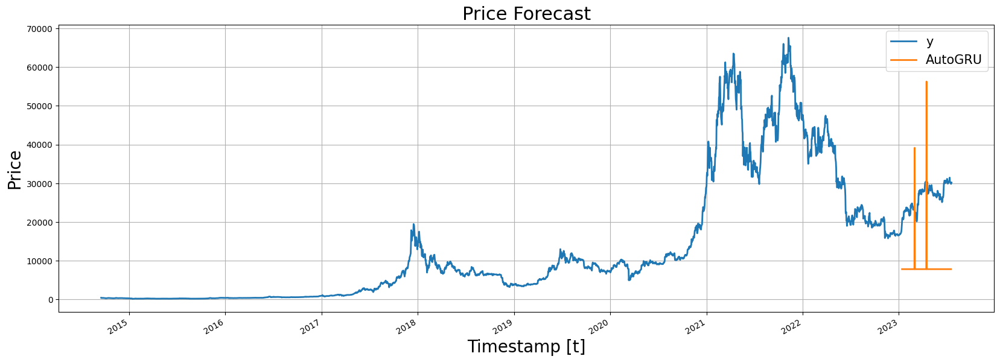

In [30]:
model = AutoGRU(
      h=horizon,
      config=None,
      backend='optuna'
    )

nf = NeuralForecast(models=[model], freq='D')
nf.fit(df=btc_train_df)
Y_hat_df = nf.predict()

fig, ax = plt.subplots(1, 1, figsize = (20, 7))
Y_hat_df = btc_test_df.merge(Y_hat_df, how='left', on=['unique_id', 'ds'])
plot_df = pd.concat([btc_train_df, Y_hat_df]).set_index('ds')

plot_df[['y', 'AutoGRU']].plot(ax=ax, linewidth=2)

ax.set_title('Price Forecast', fontsize=22)
ax.set_ylabel('Price', fontsize=20)
ax.set_xlabel('Timestamp [t]', fontsize=20)
ax.legend(prop={'size': 15})
ax.grid()

In [34]:
best_gru = {'encoder_hidden_size': 100,
             'encoder_n_layers': 3,
             'context_size': 50,
             'decoder_hidden_size': 256,
             'learning_rate': 0.00034236826881732914,
             'max_steps': 500,
             'batch_size': 32,
             'random_seed': 11,
             'input_size': 752,
             'inference_input_size': -188}

In [35]:
model = GRU(
    h=horizon,
    encoder_hidden_size=best_gru["encoder_hidden_size"],
    encoder_n_layers=best_gru["encoder_n_layers"],
    context_size=best_gru["context_size"],
    decoder_hidden_size=best_gru["decoder_hidden_size"],
    learning_rate=best_gru["learning_rate"],
    max_steps=best_gru["max_steps"],
    batch_size=best_gru["batch_size"],
    random_seed=best_gru["random_seed"],
    input_size=best_gru["input_size"],
    inference_input_size=best_gru["inference_input_size"]
)

nf = NeuralForecast(models=[model], freq='D')
nf.fit(df=btc_train_df)
Y_hat_df = nf.predict()

INFO:lightning_fabric.utilities.seed:Seed set to 11
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type          | Params | Mode 
----------------------------------------------------------
0 | loss            | MAE           | 0      | train
1 | padder          | ConstantPad1d | 0      | train
2 | scaler          | TemporalNorm  | 0      | train
3 | hist_encoder    | GRU           | 152 K  | train
4 | context_adapter | Linear        | 949 K  | train
5 | mlp_decoder     | MLP           | 13.3 K | train
----------------------------------------------------------
1.1 M     Trainable params
0         Non-trainable params
1.1 M     Total params
4.

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/neuralforecast/core.py:214: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


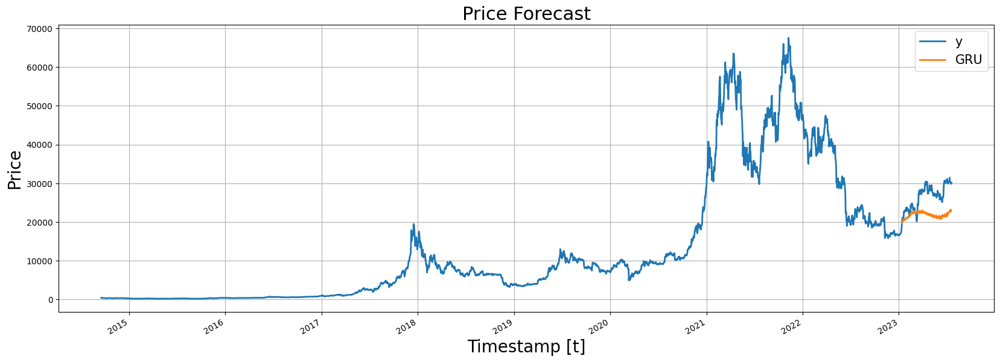

In [36]:
fig, ax = plt.subplots(1, 1, figsize = (20, 7))
Y_hat_df = btc_test_df.merge(Y_hat_df, how='left', on=['unique_id', 'ds'])
plot_df = pd.concat([btc_train_df, Y_hat_df]).set_index('ds')

plot_df[['y', 'GRU']].plot(ax=ax, linewidth=2)

ax.set_title('Price Forecast', fontsize=22)
ax.set_ylabel('Price', fontsize=20)
ax.set_xlabel('Timestamp [t]', fontsize=20)
ax.legend(prop={'size': 15})
ax.grid()

#### BiTCN

[I 2024-12-19 08:38:37,488] A new study created in memory with name: no-name-edb2ea34-af94-4371-9ef3-4392ef3d71ed
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:289: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  v = trial.suggest_uniform(k, v.lower, v.upper)
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  v = trial.suggest_loguniform(k, v.lower, v.upper)
INFO:lightning_fabric.utilities.seed:Seed set to 12
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 08:39:42,499] Trial 0 finished with value: 5876.0263671875 and parameters: {'hidden_size': 16, 'dropout': 0.5925577482448738, 'learning_rate': 0.020595425497769073, 'scaler_type': None, 'max_steps': 1000, 'batch_size': 32, 'windows_batch_size': 256, 'random_seed': 12, 'input_size': 940, 'step_size': 188}. Best is trial 0 with value: 5876.0263671875.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:289: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  v = trial.suggest_uniform(k, v.lower, v.upper)
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/re

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 08:42:23,476] Trial 1 finished with value: 19283.76953125 and parameters: {'hidden_size': 16, 'dropout': 0.5376569696924794, 'learning_rate': 0.0442833064715076, 'scaler_type': None, 'max_steps': 1000, 'batch_size': 32, 'windows_batch_size': 1024, 'random_seed': 13, 'input_size': 752, 'step_size': 1}. Best is trial 0 with value: 5876.0263671875.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:289: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  v = trial.suggest_uniform(k, v.lower, v.upper)
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releas

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 08:44:24,445] Trial 2 finished with value: 25575.65625 and parameters: {'hidden_size': 32, 'dropout': 0.08343557511052083, 'learning_rate': 0.0004976350984265951, 'scaler_type': None, 'max_steps': 1000, 'batch_size': 128, 'windows_batch_size': 256, 'random_seed': 14, 'input_size': 940, 'step_size': 1}. Best is trial 0 with value: 5876.0263671875.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:289: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  v = trial.suggest_uniform(k, v.lower, v.upper)
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/relea

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=2000` reached.
[I 2024-12-19 08:45:45,112] Trial 3 finished with value: 19562.447265625 and parameters: {'hidden_size': 16, 'dropout': 0.14367792709087612, 'learning_rate': 0.0007522199624737686, 'scaler_type': None, 'max_steps': 2000, 'batch_size': 64, 'windows_batch_size': 128, 'random_seed': 2, 'input_size': 564, 'step_size': 1}. Best is trial 0 with value: 5876.0263671875.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:289: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  v = trial.suggest_uniform(k, v.lower, v.upper)
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/rel

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
[I 2024-12-19 08:46:25,241] Trial 4 finished with value: 29944.134765625 and parameters: {'hidden_size': 16, 'dropout': 0.7620854456086038, 'learning_rate': 0.0018161785750100072, 'scaler_type': 'standard', 'max_steps': 1000, 'batch_size': 32, 'windows_batch_size': 256, 'random_seed': 7, 'input_size': 188, 'step_size': 1}. Best is trial 0 with value: 5876.0263671875.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:289: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  v = trial.suggest_uniform(k, v.lower, v.upper)
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optun

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 08:47:46,042] Trial 5 finished with value: 41595.921875 and parameters: {'hidden_size': 32, 'dropout': 0.9867990126388982, 'learning_rate': 0.01757714915626709, 'scaler_type': 'standard', 'max_steps': 500, 'batch_size': 64, 'windows_batch_size': 1024, 'random_seed': 8, 'input_size': 376, 'step_size': 1}. Best is trial 0 with value: 5876.0263671875.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:289: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  v = trial.suggest_uniform(k, v.lower, v.upper)
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/rele

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 08:48:27,759] Trial 6 finished with value: 32659.6328125 and parameters: {'hidden_size': 32, 'dropout': 0.8489179339351421, 'learning_rate': 0.05491528208719292, 'scaler_type': 'robust', 'max_steps': 500, 'batch_size': 64, 'windows_batch_size': 1024, 'random_seed': 6, 'input_size': 188, 'step_size': 1}. Best is trial 0 with value: 5876.0263671875.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:289: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  v = trial.suggest_uniform(k, v.lower, v.upper)
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/relea

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=500` reached.
[I 2024-12-19 08:49:28,826] Trial 7 finished with value: 1747953.75 and parameters: {'hidden_size': 32, 'dropout': 0.9189711995869561, 'learning_rate': 0.004701287014787184, 'scaler_type': 'robust', 'max_steps': 500, 'batch_size': 64, 'windows_batch_size': 256, 'random_seed': 14, 'input_size': 940, 'step_size': 1}. Best is trial 0 with value: 5876.0263671875.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:289: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  v = trial.suggest_uniform(k, v.lower, v.upper)
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/release

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=2000` reached.
[I 2024-12-19 08:50:50,095] Trial 8 finished with value: 41470.57421875 and parameters: {'hidden_size': 32, 'dropout': 0.8300803998366622, 'learning_rate': 0.00011807416135651083, 'scaler_type': 'standard', 'max_steps': 2000, 'batch_size': 32, 'windows_batch_size': 128, 'random_seed': 17, 'input_size': 188, 'step_size': 188}. Best is trial 0 with value: 5876.0263671875.
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:289: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  v = trial.suggest_uniform(k, v.lower, v.upper)
/usr/local/lib/python3.10/dist-packages/neuralforecast/common/_base_auto.py:291: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/op

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=2000` reached.
[I 2024-12-19 08:53:41,078] Trial 9 finished with value: 11611.6435546875 and parameters: {'hidden_size': 32, 'dropout': 0.3753370952295667, 'learning_rate': 0.00013458987921662903, 'scaler_type': 'robust', 'max_steps': 2000, 'batch_size': 32, 'windows_batch_size': 1024, 'random_seed': 13, 'input_size': 188, 'step_size': 188}. Best is trial 0 with value: 5876.0263671875.
INFO:lightning_fabric.utilities.seed:Seed set to 12
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name          | Type          | Params | Mode 
-------------------------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1000` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/neuralforecast/core.py:214: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


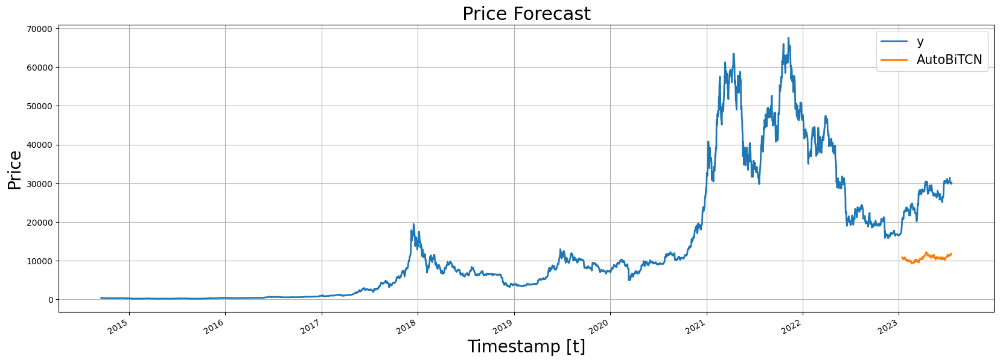

In [50]:
model = AutoBiTCN(
      h=horizon,
      config=None,
      backend='optuna'
    )

nf = NeuralForecast(models=[model], freq='D')
nf.fit(df=btc_train_df)
Y_hat_df = nf.predict()

fig, ax = plt.subplots(1, 1, figsize = (20, 7))
Y_hat_df = btc_test_df.merge(Y_hat_df, how='left', on=['unique_id', 'ds'])
plot_df = pd.concat([btc_train_df, Y_hat_df]).set_index('ds')

plot_df[['y', 'AutoBiTCN']].plot(ax=ax, linewidth=2)

ax.set_title('Price Forecast', fontsize=22)
ax.set_ylabel('Price', fontsize=20)
ax.set_xlabel('Timestamp [t]', fontsize=20)
ax.legend(prop={'size': 15})
ax.grid()

# MLforecast

Small sample of usage

In [ ]:
!pip install mlforecast
!pip install utilsforecast

In [ ]:
from mlforecast import MLForecast
from mlforecast.auto import AutoLightGBM
from mlforecast.target_transforms import Differences
from mlforecast.lag_transforms import ExpandingMean, RollingMean, ExpandingStd, Combine
from datetime import datetime, timedelta
from utilsforecast.plotting import plot_series
import lightgbm as lgb
from utilsforecast.feature_engineering import fourier
import operator

In [ ]:
adv_btc_df = pd.DataFrame()

adv_btc_df['ds'] = pd.to_datetime(btc_df['Date'])
adv_btc_df['y'] = btc_df['Close']
adv_btc_df['unique_id'] = 1

adv_btc_df

,ds,y,unique_id
0,2014-09-17,457.334015,1
1,2014-09-18,424.440002,1
2,2014-09-19,394.795990,1
3,2014-09-20,408.903992,1
4,2014-09-21,398.821014,1
...,...,...,...
3223,2023-07-15,30295.806641,1
3224,2023-07-16,30249.132813,1
3225,2023-07-17,30145.888672,1
3226,2023-07-18,29856.562500,1


In [ ]:
fcst = MLForecast(
    models=lgb.LGBMRegressor(n_jobs=1, random_state=0, verbosity=-1),
    freq='D',
    lags=[1, 24],
    lag_transforms={
        1: [
            RollingMean(window_size=7),
            RollingMean(window_size=14),
            Combine(
                RollingMean(window_size=7),
                RollingMean(window_size=14),
                operator.truediv,
            )
        ],

    },
    date_features=['year'],
)

next_n_days = 30

fcst.fit(adv_btc_df[:-next_n_days])
print(fcst.ts.features_order_)

['lag1', 'lag24', 'rolling_mean_lag1_window_size7', 'rolling_mean_lag1_window_size14', 'rolling_mean_lag1_window_size7_truediv_rolling_mean_lag1_window_size14', 'year']


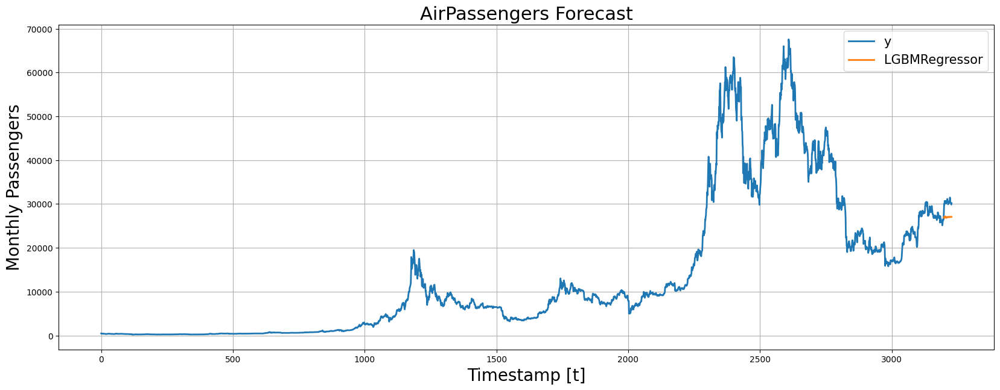

In [ ]:
preds = fcst.predict(h=next_n_days + 1)
plot_df_start = adv_btc_df.copy()

fig, ax = plt.subplots(1, 1, figsize = (20, 7))
Y_hat_df = plot_df_start.merge(preds, how='left', on=['unique_id', 'ds'])

Y_hat_df[['y', 'LGBMRegressor']].plot(ax=ax, linewidth=2)

ax.set_title('Price Forecast', fontsize=22)
ax.set_ylabel('Price', fontsize=20)
ax.set_xlabel('Timestamp [t]', fontsize=20)
ax.legend(prop={'size': 15})
ax.grid()